# Spectrum of unbounded operators and applications to PDEs.

This document presents the outcomes of our simulations, while the source code is accessible within the sub-files. 
It serves as a supplementary resource to the corresponding study report, maintaining a consistent organizational structure.

The code was written by Nicolas Roblet under the direction of Mr Romain Joly and Mr Eloi Martinet.

*Note:* The python version used for development is the 3.10.12.

## III - Numerical approach
### III.1 - Estimation of Laplacian eigenfunctions and eigenvalues
We simulate the numerical solution of the Laplacian eigenvalue problem with Dirichlet boundary conditions.

\begin{equation*}{}
    \left\{
        \begin{alignedat}{3}
            -\Delta u &= \lambda u \hspace{1.5cm} &&\text{in }\Omega, \\
            u &= 0 &&\text{on }\Gamma,
        \end{alignedat}
        \right.
\end{equation*}

### III.1.1) One dimensional case
We first consider $\Omega_I=]0,1[$.  
Let's start by looking at the eigenvectors

Computation completed successfully in 0.5689680576324463s


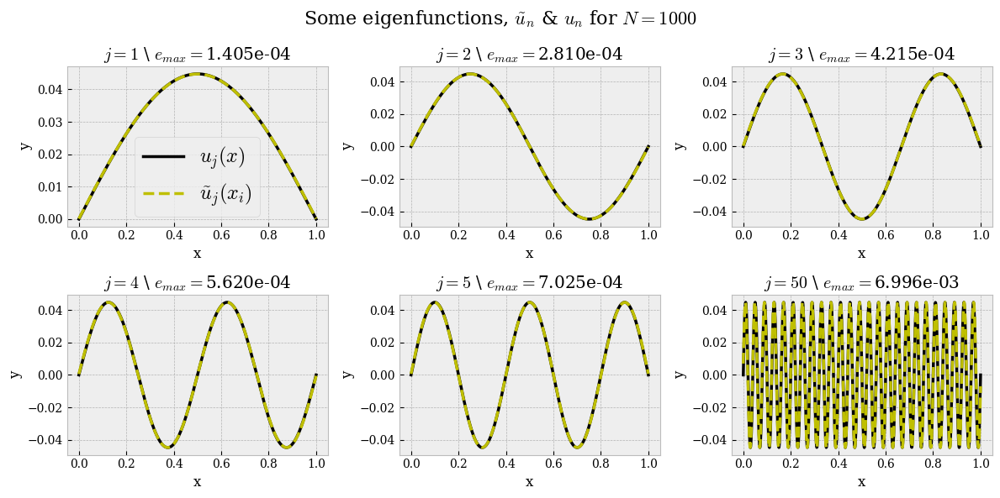

In [1]:
from lapl_1D.eigenvectors_plot import segment_eigenvectors

N = 1000 # Number of elements in the subdivision of our initial domain
js = [1,2,3,4,5,50] # Eigenvectors to plot

segment_eigenvectors(N,js)

Let's now look at the eigenvalues of this problem.

Computation completed successfully in 25.896973133087158s


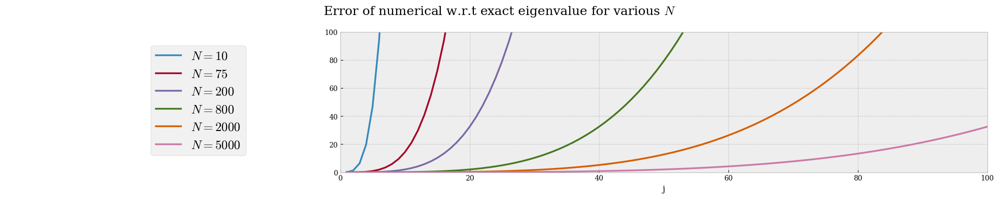

In [1]:
from lapl_1D.eigenvalues_plot import segment_eigenvalues_error

Ns = [10, 75, 200, 800, 2000, 5000] # Array of N to test

segment_eigenvalues_error(Ns)

And now let's take a closer look at the error.

Start j = 14 & eps = 0.01, estimated N : 126.
	Computation time: 0.0296242s.
Start j = 14 & eps = 0.0001, estimated N : 1269.
	Computation time: 11.7672620s.
Start j = 50 & eps = 0.01, estimated N : 453.
	Computation time: 0.6693244s.
Start j = 100 & eps = 0.01, estimated N : 906.
	Computation time: 2.1061180s.
Start j = 200 & eps = 0.01, estimated N : 1813.
	Computation time: 27.7494202s.
Computation completed successfully


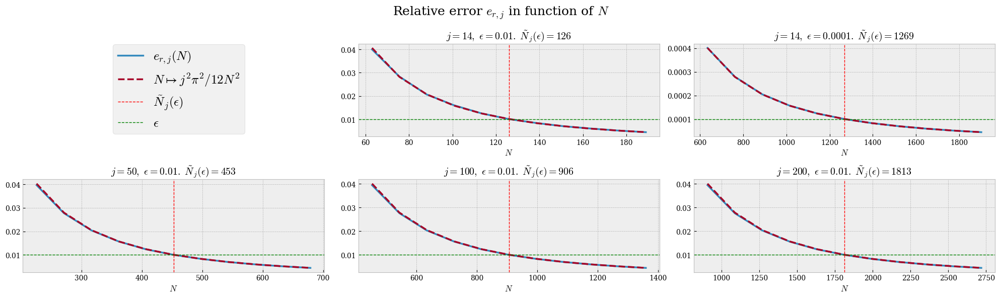

In [2]:
from lapl_1D.eigenvalues_error_study import segment_eigenvalues_error_study

js_eps = [(14,10**-2), (14,10**-4), (50,10**-2), (100,10**-2), (200,10**-2)] # (eigenvalue to analyse, precision)
nb_point_N = 11 # Number of elements in the subdivision of our initial domain
range_test= (0.5,1.5) # relative range of N

segment_eigenvalues_error_study(js_eps, nb_point_N, range_test)

### III.1.2) Extension to the rectangle of $\mathbb{R}^2$

We now consider $\Omega_R= ]0,1[\times]0,1[$.  
Let's start by looking at the exact eigenfunctions

Computation completed successfully in 0.6097049713134766s


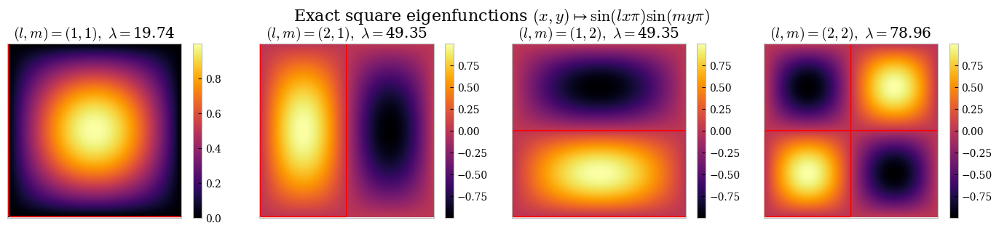

In [4]:
from lapl_2D_square.exact_eigenfunctions import exact_eigenfunction_square

ind_to_plot = [(1,1), (2,1), (1,2), (2,2)] # eigenvalue to plot
Nb_pt = 100  # Number of elements in the subdivision of our initial domain

exact_eigenfunction_square(ind_to_plot, Nb_pt)

Let's examine the eigenvectors associated.

Computation completed successfully in 9.4582200050354s


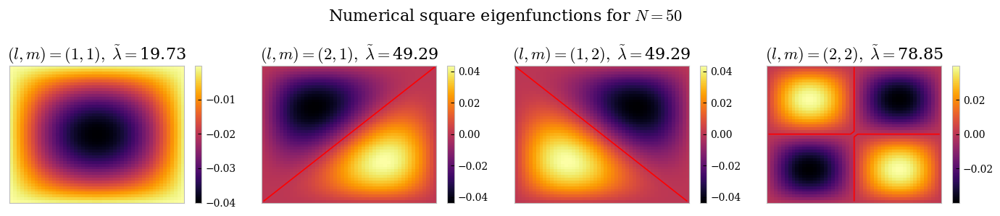

In [5]:
from lapl_2D_square.eigenvectors_plot import numerical_eigenfunctions_square

N = 50 # Number of elements in the subdivision of our initial domain
lms = [(1,1), (2,1), (1,2), (2,2)] # Eigenvectors to plot

numerical_eigenfunctions_square(N, lms)

Verification that $\widetilde{u}_\text{num}$ is indeed an eigenfunction.

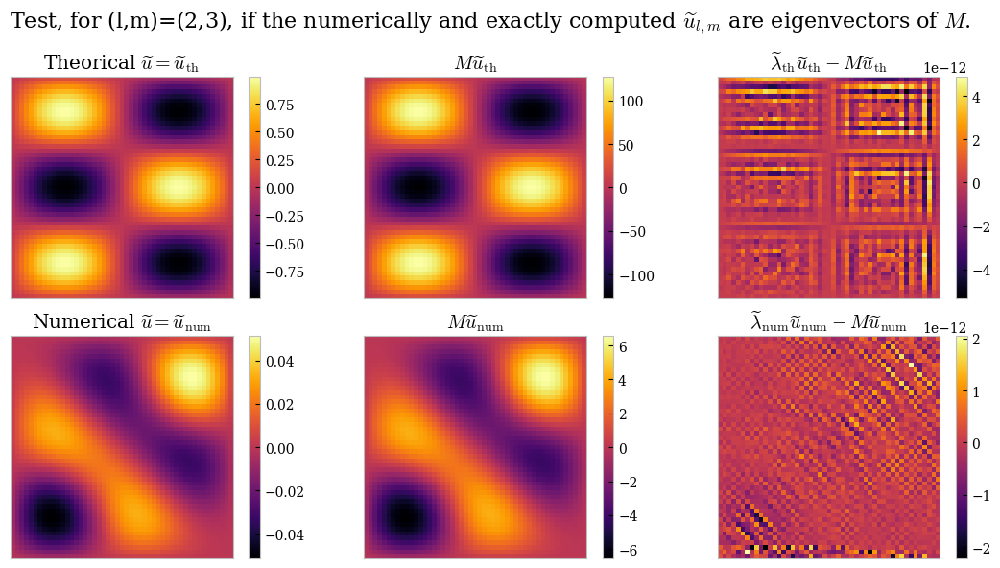

In [6]:
from lapl_2D_square.exact_num_eigenvector_comp import exact_num_eigenvector_comp as exact_num_eigenvector_comp

N = 50 # Number of elements in the subdivision of our initial domain
(l, m) = (2, 3) # index of eigenvectors to analyse

exact_num_eigenvector_comp(N, l, m)

For the rectangle

Computation completed successfully in 12.180697441101074s


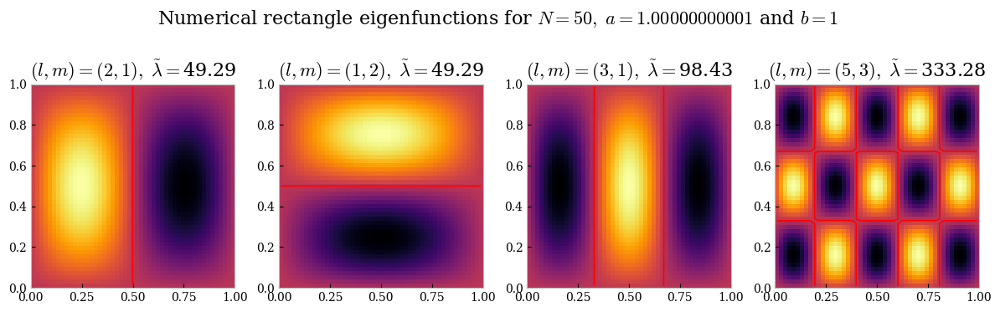

In [7]:
from lapl_2D_square.eigenvectors_plot_rect import numerical_eigenfunctions_rectangle

N = 50
a = 1 + 1e-11
b = 1
lms = [(2,1), (1,2), (3,1), (5,3)]

numerical_eigenfunctions_rectangle(N, lms, a, b)

Let's now look at the eigenvalues of our matrix $M$.

Computation completed successfully in 8.099532127380371s


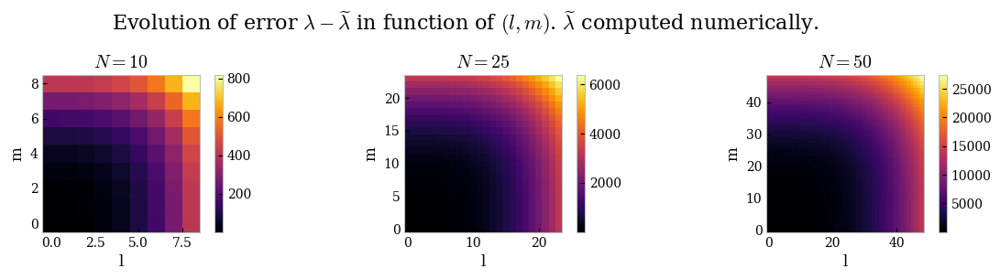

In [8]:
from lapl_2D_square.eigenvalues_plot_2D import error_eigval_2D_square

Ns = [10, 25, 50] 

error_eigval_2D_square(Ns)

About relative error.

Computation completed successfully in 63.83047914505005s


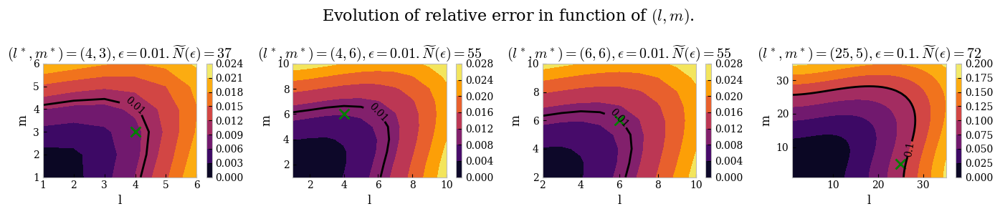

In [9]:
from lapl_2D_square.eigenvalues_error import plot_rel_error_eigval as plot_rel_error_eigval_square
   
lms_eps = [((4,3), 0.01), ((4,6),0.01), ((6,6),0.01), ((25,5),0.1)] # ((l,m), epsilon)
shift_plot = (2, 4, 4, 10) # plot beteen (0,0)x(l+shift,m+shift)

plot_rel_error_eigval_square(lms_eps, shift_plot)

### III.1.3) On any domain of $\mathbb{R}^2$

Exact solution on unit disk

Computation completed successfully in 5.944801092147827s.


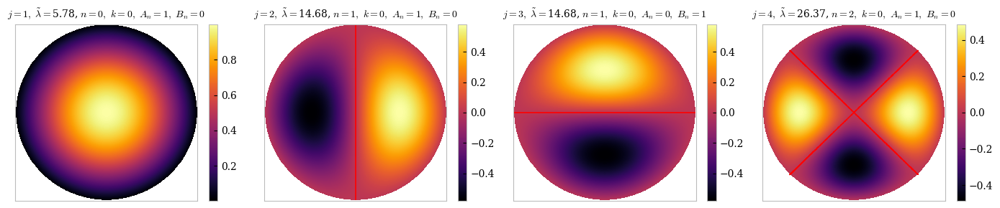

In [10]:
from lapl_2D.exact_disk import exact_disk

js = [j for j in range(1,5)] #eigval to plot
k = 4 # nb of subroot to consider 
Nx, Ny = 1000, 1000

_, _ = exact_disk(Nx, Ny, k, js =js)

Now let us work with an arbitrary domain $\Omega$.
##### Example with Chladni figures.

Computation completed successfully in 3.5731821060180664s.


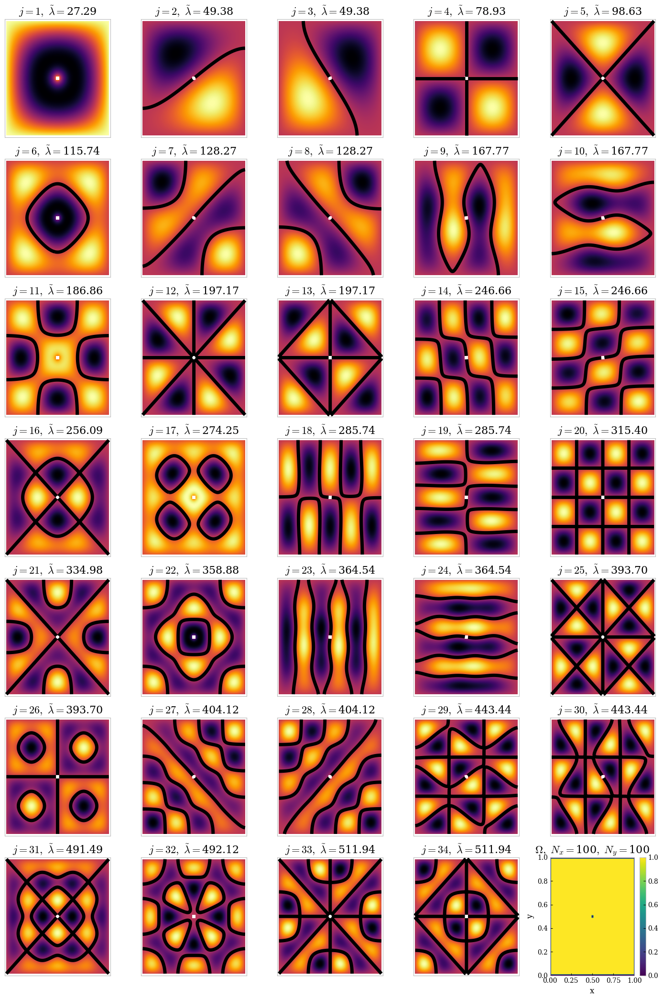

In [3]:
from lapl_2D.any_domain import compute_eigenval as compute_eigenval
import numpy as np

js = [j for j in range(1,35)]
k = max(js)

# Rectangle
# Nx, Ny = 51, 51
# a, b = 1, 1
# domain = np.zeros((Ny,Nx)) 
# domain[1:-1,1:-1] = 1

# Chladni
Nx, Ny = 100, 100
a, b = 1, 1
domain = np.zeros((Ny,Nx)) 
domain[1:-1,1:-1] = 1

radius_discrete = 1.2/Nx
# radius_discrete = 12/Nx
centerx, centery = a / 2, b / 2
for j in range(Ny):
    for i in range(Nx):
        norme = np.sqrt(((i+1/2)*a/Nx - centerx)**2 + (b - (j +1/2)*b/Ny - centery)**2)
        if norme <= radius_discrete:
            domain[j, i] = 0

# import matplotlib.pyplot as plt
# plt.imshow(domain)
# plt.show()

#L
# Nx, Ny = 50, 50
# a, b = 1, 1
# domain = np.zeros((Ny,Nx)) 
# domain[1:-1,1:-1] = 1
# domain[:Nx//2,Ny//2:] = 0 

# Circle
# Nx, Ny = 71, 71
# a, b = 2, 2
# domain = np.zeros((Ny,Nx))
# radius = 1 - max(a/Nx, b/Ny) * 3/2

# centerx, centery = a / 2, b / 2
# for j in range(Ny):
#     for i in range(Nx):
#         norme = np.sqrt(((i + 1/2)*a/Nx - centerx)**2 + (b - (j + 1/2)*b/Ny - centery)**2)
#         if norme <= radius:
#             domain[j, i] = 1
# radius_discrete = 1 - max(a/Nx, b/Ny) * 3/2

# domain = np.zeros((Ny,Nx)) 
# centerx, centery = a / 2, b / 2
# for j in range(Ny):
#     for i in range(Nx):
#         norme = np.sqrt(((i+1/2)*a/Nx - centerx)**2 + (b - (j +1/2)*b/Ny - centery)**2)
#         if norme <= radius_discrete:
#             domain[j, i] = 1

_, _ = compute_eigenval(domain, a, b, k, js = js)


##### Test on the disk

Start Nx, Ny = 100, 101
30 numerical eigenvector calculated in 1.0173449516296387s.
30 exact eigenvector calculated in 0.5119993686676025s.
Start Nx, Ny = 200, 201
30 numerical eigenvector calculated in 4.9256463050842285s.
30 exact eigenvector calculated in 1.499901294708252s.
Start Nx, Ny = 500, 501
30 numerical eigenvector calculated in 39.8540518283844s.
30 exact eigenvector calculated in 8.348480701446533s.
Start Nx, Ny = 700, 701
30 numerical eigenvector calculated in 92.88275575637817s.
30 exact eigenvector calculated in 17.425052404403687s.
Start Nx, Ny = 1000, 1001
30 numerical eigenvector calculated in 160.70910096168518s.
30 exact eigenvector calculated in 28.169393301010132s.


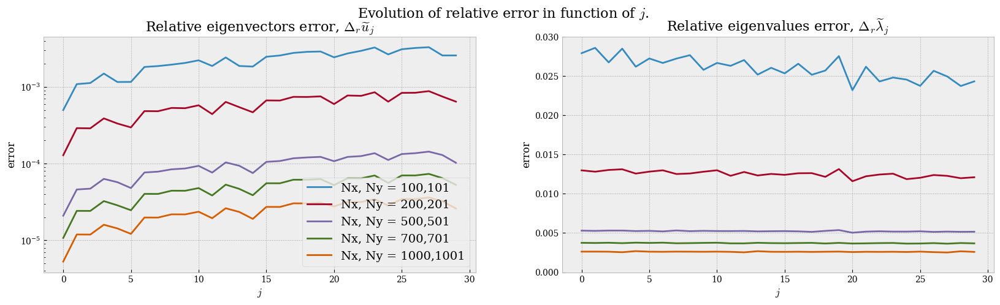

In [12]:
from lapl_2D.analyse_diff_disk import analyse_diff_disk as analyse_diff_disk

k = 30
Nxys = ((100,101), (200,201), (500,501), (700,701), (1000,1001))# break symmetry to get orthogonal eigenvalues
k_to_plot = (0,k)


analyse_diff_disk(Nxys, k, k_to_plot)

Plot more precisely difference

30 numerical eigenvector calculated in 11.19438624382019s.
30 exact eigenvector calculated in 2.3835434913635254s.
Computation completed successfully in 17.69502282142639s.


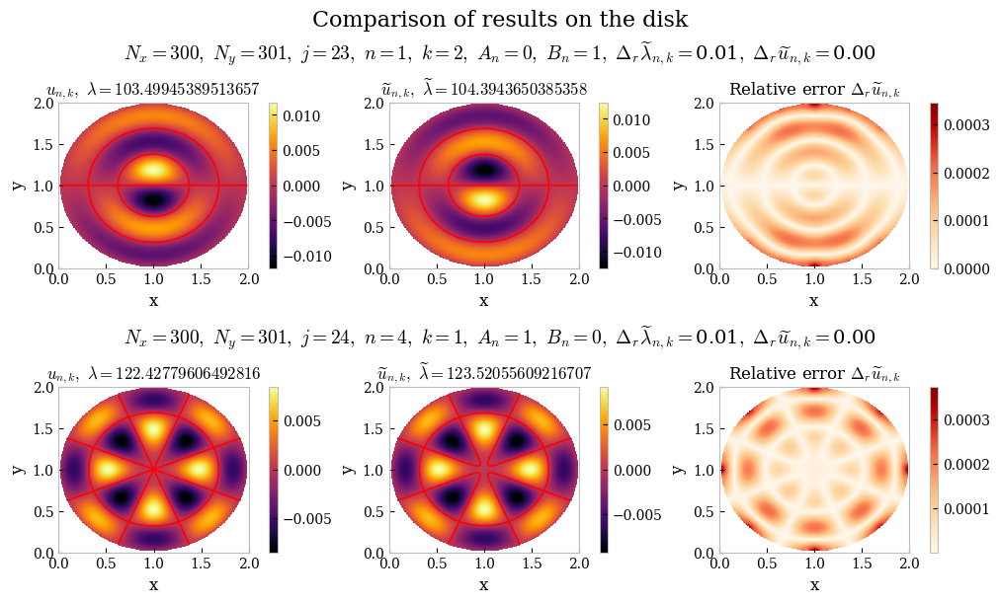

In [13]:
from lapl_2D.diff_disk import test_diff_disk as test_diff_disk

js = [j for j in range(23,25)]
k = 30
Nx, Ny = 300,301

_, _, _, _ = test_diff_disk(Nx, Ny, k, js = js)

##### Test on quarter disk

Start Nx, Ny = 100, 101
30 numerical eigenvector calculated in 1.0438642501831055s.
30 exact eigenvector calculated in 0.6942915916442871s.
Start Nx, Ny = 200, 201
30 numerical eigenvector calculated in 4.4228270053863525s.
30 exact eigenvector calculated in 1.9473576545715332s.
Start Nx, Ny = 500, 501
30 numerical eigenvector calculated in 28.01963520050049s.
30 exact eigenvector calculated in 8.772503137588501s.
Start Nx, Ny = 700, 701
30 numerical eigenvector calculated in 53.93410921096802s.
30 exact eigenvector calculated in 20.475053787231445s.
Start Nx, Ny = 1000, 1001
30 numerical eigenvector calculated in 167.31893348693848s.
30 exact eigenvector calculated in 42.88764476776123s.


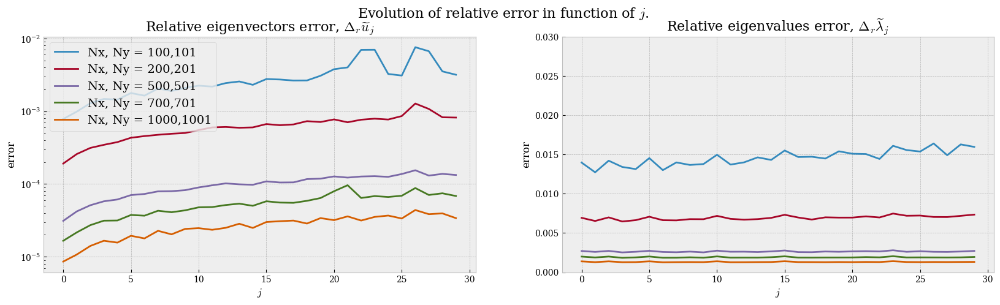

In [14]:
from lapl_2D.analyse_diff_quarter_disk import analyse_diff_quarter_disk as analyse_diff_quarter_disk

k = 30
Nxys = ((100,101), (200,201), (500,501), (700,701), (1000,1001)) # break symmetry to get orthogonal eigenvalues
k_to_plot = (0,k)

analyse_diff_quarter_disk(Nxys, k, k_to_plot)

Plot more precisely difference

30 numerical eigenvector calculated in 11.483619451522827s.
30 exact eigenvector calculated in 4.034356355667114s.
Computation completed successfully in 17.268308639526367s.


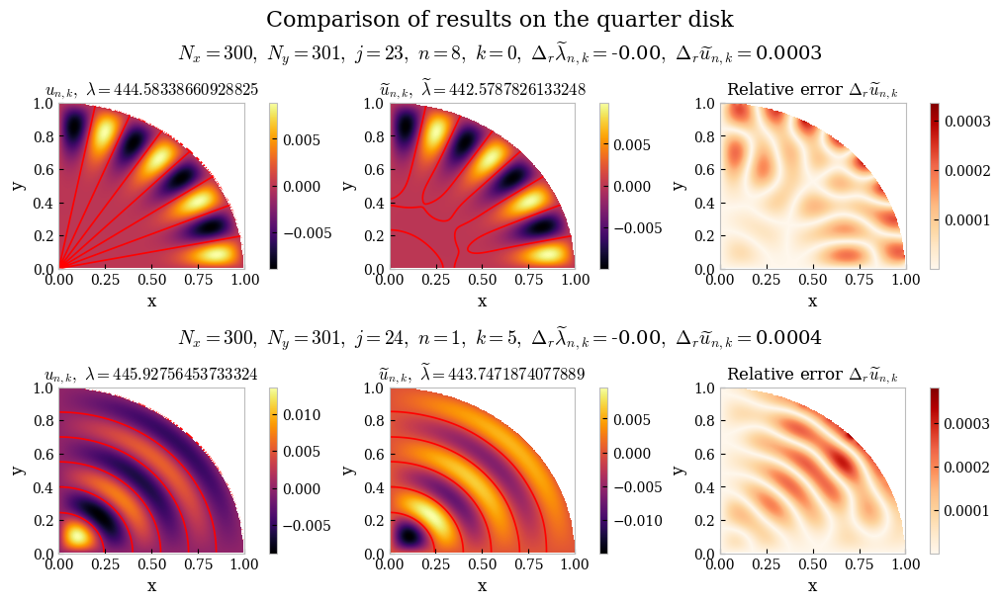

In [15]:
from lapl_2D.diff_quarter_disk import test_diff_quarter_disk 

js = [j for j in range(23,25)]
k = 30
Nx, Ny = 300,301

_, _, _, _ = test_diff_quarter_disk(Nx, Ny, k, js = js)


## III.2 - Numerical shape optimization
### III.2.1) Phase-field approach

Optimize the shape to minimize the first eigenvalue by changing the one and zero components on the neighborhood.

Computation completed successfully in 0.5432920455932617s.


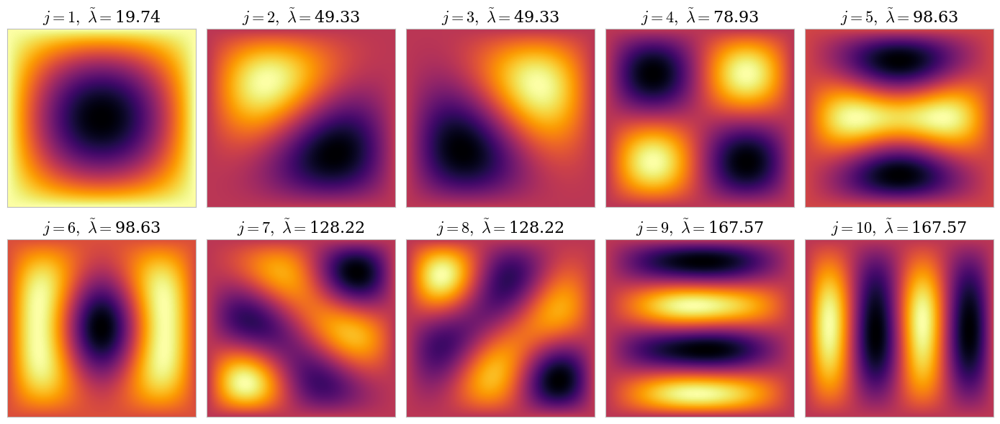

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from shape_opti.cpt_eigval_phasefield import compute_eigenval_phasefield

js = [j for j in range(1,11)]
k = max(js)
b = 550

Nx, Ny = 100, 100
phase_field_0 = -np.ones((Nx, Ny))
# phase_field [50:75, 25:75] = 1
phase_field_0 [1:-1, 1:-1] = 1

# radius_discrete = 49/Nx
# centerx, centery = 1 / 2, 1 / 2
# for j in range(Ny):
#     for i in range(Nx):
#         norme = np.sqrt(((i+1/2)/Nx - centerx)**2 + (1-(j +1/2)/Ny - centery)**2)
#         if norme <= radius_discrete:
#             phase_field[j, i] = 1


_, _ = compute_eigenval_phasefield(phase_field_0, eps =0.0000002, k = k, b = b, js = js)

### III.2.2 The approximate eigenvalue problem

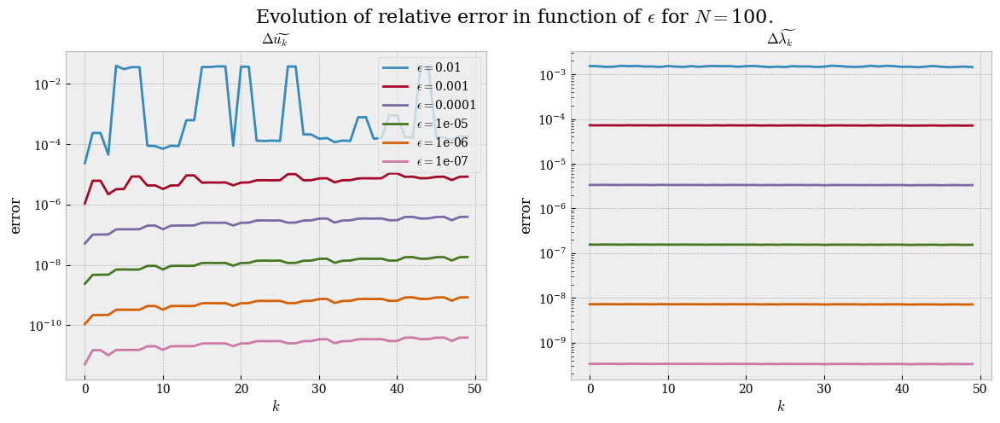

In [1]:
from shape_opti.diff_square import test_error_square

N = 100
list_eps = [1e-2, 1e-3, 1e-4, 1e-5, 1e-6, 1e-7]
# list_eps = [1e-15]
k_max = 50

test_error_square(N, liste_eps = list_eps, k_max = k_max, plot = False)

### III.2.3 Optimization process

#### Faber-Krahn : First eigenvalue optimization

Progress:   0%|          | 0/50 [00:00<?, ?step/s]

J decrease: True


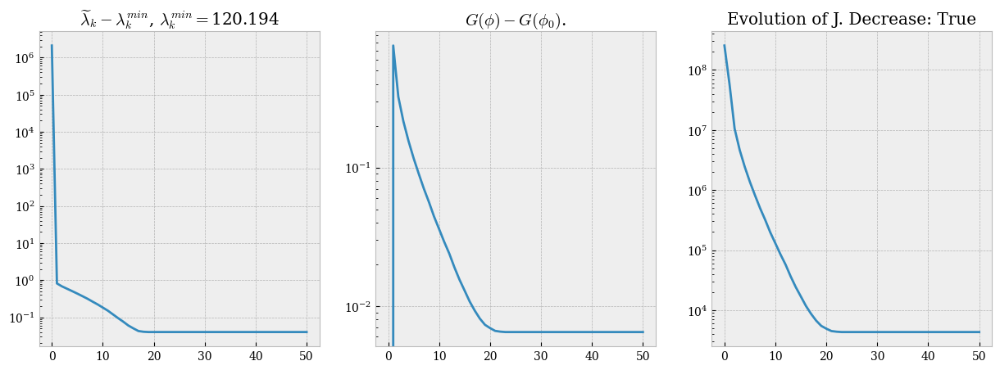

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from shape_opti.optim_num import opti_shape_ev
from lapl_2D.exact_disk import create_domain_disk
from lapl_2D.any_domain import compute_eigenval

ev_to_opt = 1   # eigenvalue to optimise
size_eigenspace = 1

Nx, Ny = 200, 200
phase_field_0 =  -np.ones((Nx, Ny))

#square
phase_field_0[1:-1, 1:-1] = - 0.7

alpha = 1e8
beta = 1e-50
gamma = 0.025
eps= 5e-5
b = 550
nb_iter = 50

#exact solution
radius = np.sqrt(np.sum(phase_field_0+1) / (2* np.pi))
exact_sol = create_domain_disk(Nx, Ny, Nx, Ny, radius)
eigvect, min_ev = compute_eigenval(exact_sol, a = 1, b = 1, k = 1, plot = False)

list_phase_field, list_grad_J, list_grad_lamb, list_grad_V, list_grad_E = opti_shape_ev(ev_to_opt = ev_to_opt,
                                                                                        size_eigenspace = size_eigenspace,
                                                                                        phase_field_0 = phase_field_0,
                                                                                        alpha = alpha,
                                                                                        beta = beta,
                                                                                        gamma = gamma,
                                                                                        eps = eps,
                                                                                        b = b,
                                                                                        nb_iter = nb_iter,
                                                                                        plot = True,
                                                                                        min_ev = min_ev[0]
                                                                                        )

In [19]:
%%capture
%matplotlib inline
##################################################
#               Create animation                 #
##################################################
import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
from lapl_2D.exact_disk import create_domain_disk

plt.rcParams["animation.html"] = "jshtml"

nb_image = nb_iter +1
div = (nb_iter + 1) // nb_image

fig, axs = plt.subplots(figsize=(15, 9))
fig.clear()
gs = gridspec.GridSpec(3, 4)

ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2:4])
ax3 = fig.add_subplot(gs[2, 0])
ax4 = fig.add_subplot(gs[2, 1])
ax5 = fig.add_subplot(gs[2, 2])
ax6 = fig.add_subplot(gs[2, 3])

im1 = ax1.imshow(list_phase_field[0], cmap='magma', vmin = -1, vmax = 1)
colorbar1 = plt.colorbar(im1, ax=ax1)
im2 = ax2.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar2 = plt.colorbar(im2, ax=ax2)
im3 = ax3.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar3 = plt.colorbar(im3, ax=ax3)
im4 = ax4.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar4 = plt.colorbar(im4, ax=ax4)
im5 = ax5.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar5 = plt.colorbar(im5, ax=ax5)
im6 = ax6.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar6 = plt.colorbar(im6, ax=ax6)

def animate(i):
    ax1.clear()
    ax2.clear()
    ax3.clear()
    ax4.clear()
    ax5.clear()
    ax6.clear()

    im1 = ax1.imshow(list_phase_field[i], cmap='magma', vmin = -1, vmax = 1)
    ax1.set_facecolor('white')
    ax1.set_title(r'$\phi_k$', fontsize = 12)
    ax1.grid(False)
    ax1.set_xticks([])
    ax1.set_yticks([])
    colorbar1.update_normal(im1)

    if i == nb_image-1:
        ax2.axis('off')
        ax3.axis('off')
        ax4.axis('off')
        ax5.axis('off')
        ax6.axis('off')
    else:
        im2 = ax2.imshow(np.clip(-gamma * list_grad_J[div * i], -1, 1), cmap='seismic')
        ax2.set_facecolor('white')
        ax2.set_title(r'$-\gamma \nabla J(\phi_k)$', fontsize = 12)
        ax2.grid(False)
        colorbar2.update_normal(im2)
        ax2.set_xticks([])
        ax2.set_yticks([])


        im3 = ax3.imshow((np.clip(-gamma * list_grad_J[div * i], -1, 1))>0, cmap='seismic')
        ax3.set_facecolor('white')
        ax3.set_title(r'$-\gamma \nabla J(\phi_k)>0$', fontsize = 12)
        ax3.grid(False)
        colorbar3.update_normal(im3)
        ax3.set_xticks([])
        ax3.set_yticks([])

        im4 = ax4.imshow(-gamma * list_grad_lamb[div * i], cmap='seismic')
        ax4.set_facecolor('white')
        ax4.set_title(r'$-\gamma \nabla \lambda(\phi_k)$', fontsize = 12)
        ax4.grid(False)
        colorbar4.update_normal(im4)
        ax4.set_xticks([])
        ax4.set_yticks([])

        im5 = ax5.imshow(-gamma * alpha * list_grad_V[div * i], cmap='seismic')
        ax5.set_facecolor('white')
        ax5.set_title(r'$-\gamma \alpha \nabla V(\phi_k)$', fontsize = 12)
        ax5.grid(False)
        colorbar5.update_normal(im5)
        ax5.set_xticks([])
        ax5.set_yticks([])


        im6 = ax6.imshow(-gamma * beta * list_grad_E[div * i], cmap='seismic')
        ax6.set_facecolor('white')
        ax6.set_title(r'$-\gamma \beta \nabla E^{\epsilon}_{BL} (\phi_k)$', fontsize = 12)
        ax6.grid(False)
        colorbar6.update_normal(im6)
        ax6.set_xticks([])
        ax6.set_yticks([])


    fig.suptitle(rf"State at k={div * i}, $\alpha=${alpha}, $\beta=${beta}, $\gamma=${gamma}, $\epsilon=${eps}", fontsize=16)

ani = animation.FuncAnimation(fig, animate, frames=nb_image, repeat=False)

# uncomment to save the gif
ani.save('1_gif/first_ev_opti.gif', writer='imagemagick', fps=5)

In [20]:
# plot the animation
ani

#### Second eigenvalue optimization

Progress:   0%|          | 0/50 [00:00<?, ?step/s]

J decrease: True


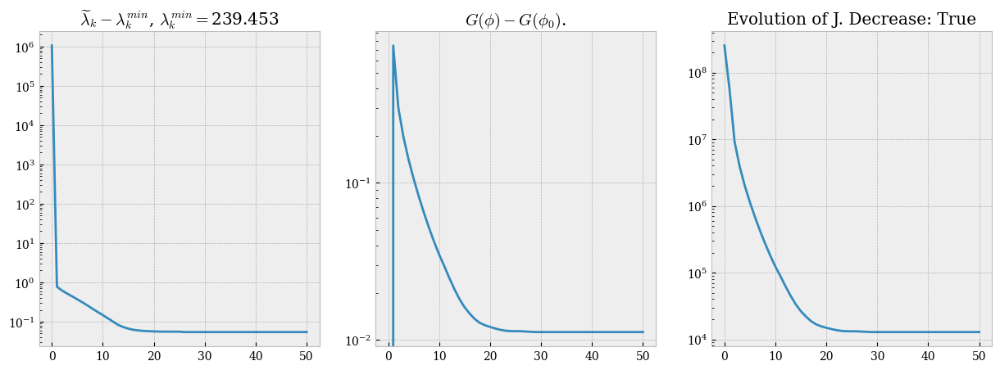

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from shape_opti.optim_num import opti_shape_ev
from lapl_2D.exact_disk import create_domain_disk
from lapl_2D.any_domain import compute_eigenval

ev_to_opt = 2   # eigenvalue to optimise
size_eigenspace = 2

Nx, Ny = 200, 200
phase_field_0 = -np.ones((Nx, Ny))
phase_field_0[1:-1, 1:-1] = -0.7

alpha = 1e8
beta = 0
gamma = 0.025
eps= 5e-5
b = 550
nb_iter = 50

radius = np.sqrt(np.sum(phase_field_0+1) / (4* np.pi))
exact_sol = np.zeros_like(phase_field_0)
exact_sol[Nx//2:Nx,0:Ny//2] = create_domain_disk(Nx//2, Ny//2, Nx//2, Ny//2, radius)
exact_sol[0:Nx//2,Ny//2-0:Ny] = create_domain_disk(Nx//2, Ny//2, Nx//2, Ny//2, radius)
eigvect, min_ev = compute_eigenval(exact_sol, a = 1, b = 1, k = 2, plot = False)

list_phase_field, list_grad_J, list_grad_lamb, list_grad_V, list_grad_E = opti_shape_ev(ev_to_opt = ev_to_opt,
                                                                                        size_eigenspace = size_eigenspace,
                                                                                        phase_field_0 = phase_field_0,
                                                                                        alpha = alpha,
                                                                                        beta = beta,
                                                                                        gamma = gamma,
                                                                                        eps = eps,
                                                                                        b = b,
                                                                                        nb_iter = nb_iter,
                                                                                        min_ev = min_ev[1]
                                                                                        )


In [22]:
%%capture
%matplotlib inline

##################################################
#               Create animation                 #
##################################################

import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
from lapl_2D.exact_disk import create_domain_disk

plt.rcParams["animation.html"] = "jshtml"

nb_image = nb_iter + 1
div = (nb_iter + 1) // nb_image

fig, axs = plt.subplots(figsize=(15, 8))
fig.clear()
gs = gridspec.GridSpec(3, 4)

ax1 = fig.add_subplot(gs[0:2, 0:2])
ax2 = fig.add_subplot(gs[0:2, 2:4])
ax3 = fig.add_subplot(gs[2, 0])
ax4 = fig.add_subplot(gs[2, 1])
ax5 = fig.add_subplot(gs[2, 2])
ax6 = fig.add_subplot(gs[2, 3])

im1 = ax1.imshow(list_phase_field[0], cmap='magma', vmin = -1, vmax = 1)
colorbar1 = plt.colorbar(im1, ax=ax1)
im2 = ax2.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar2 = plt.colorbar(im2, ax=ax2)
im3 = ax3.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar3 = plt.colorbar(im3, ax=ax3)
im4 = ax4.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar4 = plt.colorbar(im4, ax=ax4)
im5 = ax5.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar5 = plt.colorbar(im5, ax=ax5)
im6 = ax6.imshow(-gamma *list_grad_J[0], cmap='seismic')
colorbar6 = plt.colorbar(im6, ax=ax6)

def animate(i):
    ax1.clear()
    ax2.clear()
    ax3.clear()
    ax4.clear()
    ax5.clear()
    ax6.clear()

    im1 = ax1.imshow(list_phase_field[i], cmap='magma', vmin = -1, vmax = 1)
    ax1.set_facecolor('white')
    ax1.set_title(r'$\phi_k$', fontsize = 12)
    ax1.grid(False)
    colorbar1.update_normal(im1)
    ax1.set_xticks([])
    ax1.set_yticks([])

    if i == nb_image-1:
        ax2.axis('off')
        ax3.axis('off')
        ax4.axis('off')
        ax5.axis('off')
        ax6.axis('off')
    else:
        im2 = ax2.imshow(np.clip(-gamma * list_grad_J[div * i], -1, 1), cmap='seismic')
        ax2.set_facecolor('white')
        ax2.set_title(r'$-\gamma \nabla J(\phi_k)$', fontsize = 12)
        ax2.grid(False)
        colorbar2.update_normal(im2)
        ax2.set_xticks([])
        ax2.set_yticks([])

        im3 = ax3.imshow((np.clip(-gamma * list_grad_J[div * i], -1, 1))>0, cmap='seismic')
        ax3.set_facecolor('white')
        ax3.set_title(r'$-\gamma \nabla J(\phi_k)>0$', fontsize = 12)
        ax3.grid(False)
        colorbar3.update_normal(im3)
        ax3.set_xticks([])
        ax3.set_yticks([])
        
        im4 = ax4.imshow(-gamma * list_grad_lamb[div * i], cmap='seismic')
        ax4.set_facecolor('white')
        ax4.set_title(r'$-\gamma \nabla \lambda(\phi_k)$', fontsize = 12)
        ax4.grid(False)
        colorbar4.update_normal(im4)
        ax4.set_xticks([])
        ax4.set_yticks([])

        im5 = ax5.imshow(-gamma * alpha * list_grad_V[div * i], cmap='seismic')
        ax5.set_facecolor('white')
        ax5.set_title(r'$-\gamma \alpha \nabla V(\phi_k)$', fontsize = 12)
        ax5.grid(False)
        colorbar5.update_normal(im5)
        ax5.set_xticks([])
        ax5.set_yticks([])
        
        im6 = ax6.imshow(-gamma * beta * list_grad_E[div * i], cmap='seismic')
        ax6.set_facecolor('white')
        ax6.set_title(r'$-\gamma \beta \nabla E^{\epsilon}_{BL} (\phi_k)$', fontsize = 12)
        ax6.grid(False)
        colorbar6.update_normal(im6)
        ax6.set_xticks([])
        ax6.set_yticks([])
    fig.suptitle(rf"State at k={div * i}, $\alpha=${alpha}, $\beta=${beta}, $\gamma=${gamma}, $\epsilon=${eps}", fontsize=16)

ani = animation.FuncAnimation(fig, animate, frames=nb_image, repeat=False)

# uncomment to save the gif
ani.save('1_gif/second_ev_opti.gif', writer='imagemagick', fps=5)

In [23]:
#plot the animation
ani